
USGS の API から最新の地震データを取得し、  
- 時刻の変換（UTC → JST）  
- マグニチュードと深さの関係可視化  
- 世界地図上での地震プロット（色分け & ツールチップ）  
を行いました。
地震の分布や規模が直感的に理解できる「Impact のある可視化」を目標にしています


In [1]:

import pandas as pd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster

# USGS 1ヶ月の全地震データ
url = "https://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/all_month.csv"

df = pd.read_csv(url)

# 列名を統一
df.rename(columns={
    "time": "time_ms",
    "mag": "mag",
    "depth": "depth_km",
    "latitude": "latitude",
    "longitude": "longitude"
}, inplace=True)

df.head()


,time_ms,latitude,longitude,depth_km,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2025-11-19T04:39:41.225Z,60.703659,-150.191833,36.039215,2.031807,ml,26.0,78.345825,0.193242,0.531774,...,2025-11-19T04:40:45.795Z,"31 km NW of Cooper Landing, Alaska",earthquake,0.00,5.49753,0.00,1.0,automatic,ak,ak
1,2025-11-19T04:34:03.960Z,38.838001,-122.796501,2.260000,0.770000,md,9.0,74.000000,0.004826,0.010000,...,2025-11-19T04:35:40.698Z,"7 km WNW of Cobb, CA",earthquake,0.41,1.63000,0.16,9.0,automatic,nc,nc
2,2025-11-19T04:33:37.150Z,38.836834,-122.796669,2.240000,0.210000,md,7.0,93.000000,0.005184,0.010000,...,2025-11-19T04:35:15.573Z,"7 km WNW of Cobb, CA",earthquake,0.50,1.68000,0.08,8.0,automatic,nc,nc
3,2025-11-19T04:33:12.430Z,38.835999,-122.798164,1.950000,1.260000,md,23.0,67.000000,0.006565,0.030000,...,2025-11-19T04:34:50.921Z,"7 km WNW of Cobb, CA",earthquake,0.21,0.43000,0.10,23.0,automatic,nc,nc
4,2025-11-19T04:32:40.710Z,38.837334,-122.796837,2.320000,2.310000,md,48.0,44.000000,0.005183,0.060000,...,2025-11-19T04:36:02.210Z,"7 km WNW of Cobb, CA",earthquake,0.18,0.26000,0.15,57.0,automatic,nc,nc


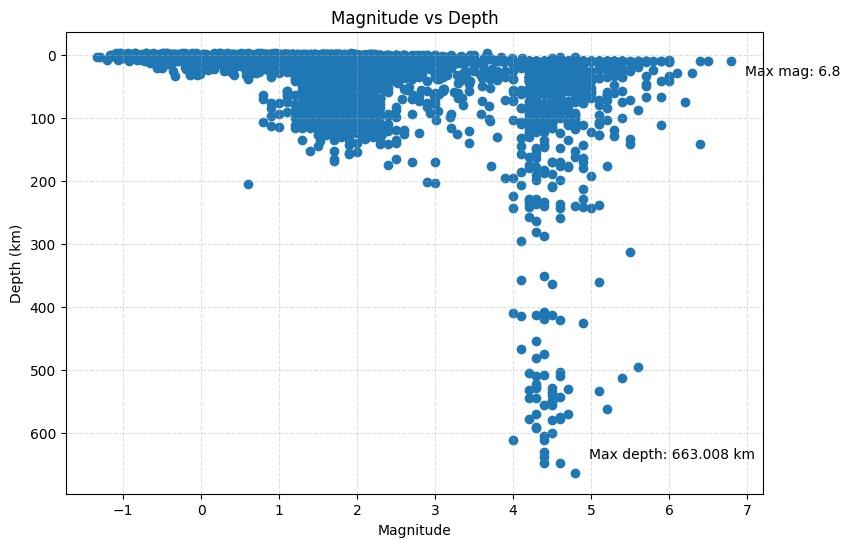

In [2]:
plt.figure(figsize=(9,6))
plt.scatter(df['mag'], df['depth_km'])
plt.xlabel("Magnitude")
plt.ylabel("Depth (km)")
plt.title("Magnitude vs Depth")

# 最大マグニチュード
max_mag_idx = df["mag"].idxmax()
plt.annotate(
    f"Max mag: {df.loc[max_mag_idx,'mag']}",
    (df.loc[max_mag_idx,'mag'], df.loc[max_mag_idx,'depth_km']),
    xytext=(10, -10), textcoords="offset points"
)

# 最大深度
max_depth_idx = df["depth_km"].idxmax()
plt.annotate(
    f"Max depth: {df.loc[max_depth_idx,'depth_km']} km",
    (df.loc[max_depth_idx,'mag'], df.loc[max_depth_idx,'depth_km']),
    xytext=(10, 10), textcoords="offset points"
)

plt.gca().invert_yaxis()
plt.grid(True, linestyle="--", alpha=0.4)
plt.show()

In [3]:
# 改良版：JST時刻列の作成を含めた folium マップ作成コード
import pandas as pd
import folium
from folium.plugins import MarkerCluster
import math
import os

# 出力先
OUT_HTML = "./outputs/earthquake_map.html"
os.makedirs("./outputs", exist_ok=True)

# --- 1) 時刻列があるか確認して JST 文字列列を作る ---
# (df は既に読み込まれている前提)
# 対応する列名: 'time' (ISO文字列), 'time_ms' (UNIXミリ秒), 'time_utc' など

if 'time_jst_str' not in df.columns:
    # 優先順に存在する列を使う
    if 'time' in df.columns:
        # USGS の CSV の場合 'time' は ISO 8601 文字列 (例: "2025-11-19T12:34:56.789Z")
        try:
            df['time_utc'] = pd.to_datetime(df['time'], utc=True)
            df['time_jst'] = df['time_utc'].dt.tz_convert('Asia/Tokyo')
            df['time_jst_str'] = df['time_jst'].dt.strftime('%Y-%m-%d %H:%M:%S')
        except Exception as e:
            # フォーマット問題があれば文字列をそのまま保持（フォールバック）
            print("Warning: failed to parse 'time' column to datetime:", e)
            df['time_jst_str'] = df['time'].astype(str)
    elif 'time_ms' in df.columns:
        # ミリ秒で与えられている場合
        try:
            df['time_utc'] = pd.to_datetime(df['time_ms'], unit='ms', utc=True)
            df['time_jst'] = df['time_utc'].dt.tz_convert('Asia/Tokyo')
            df['time_jst_str'] = df['time_jst'].dt.strftime('%Y-%m-%d %H:%M:%S')
        except Exception as e:
            print("Warning: failed to parse 'time_ms' column to datetime:", e)
            df['time_jst_str'] = df['time_ms'].astype(str)
    else:
        # 時刻カラムが見つからない場合は空文字列で埋める
        print("Notice: no 'time' or 'time_ms' column found. Filling time_jst_str with empty strings.")
        df['time_jst_str'] = ''

# --- 2) 必要な列名の正規化（存在しない列名にはデフォルトを設定） ---
# 期待カラム: latitude, longitude, mag, depth or depth_km
if 'latitude' not in df.columns and 'lat' in df.columns:
    df = df.rename(columns={'lat': 'latitude'})
if 'longitude' not in df.columns and 'lon' in df.columns:
    df = df.rename(columns={'lon': 'longitude'})
if 'depth_km' not in df.columns and 'depth' in df.columns:
    df = df.rename(columns={'depth': 'depth_km'})

# 欠損カラムの補完
if 'latitude' not in df.columns or 'longitude' not in df.columns:
    raise KeyError("DataFrame must contain 'latitude' and 'longitude' columns.")
if 'mag' not in df.columns:
    df['mag'] = float('nan')
if 'depth_km' not in df.columns:
    df['depth_km'] = float('nan')

# --- 3) 地図作成（安全に処理する） ---
# 緯度経度の平均で中心を決めるが、欠損が多いときは [0,0] にフォールバック
valid_coords = df[['latitude','longitude']].dropna()
if len(valid_coords) == 0:
    center = [0, 0]
else:
    center = [valid_coords['latitude'].mean(), valid_coords['longitude'].mean()]

m = folium.Map(location=center, zoom_start=2, tiles='OpenStreetMap')
mc = MarkerCluster().add_to(m)

def mag_color(mag):
    try:
        if math.isnan(mag):
            return "blue"   # mag不明は青
        mag = float(mag)
    except Exception:
        return "blue"
    if mag < 4.0:
        return "green"
    elif 4.0 <= mag <= 6.0:
        return "orange"
    else:
        return "red"

# プロット（NaNの行はスキップせず、表示可能な情報だけツールチップに入れる）
for _, row in df.iterrows():
    lat = row.get('latitude', None)
    lon = row.get('longitude', None)
    if pd.isna(lat) or pd.isna(lon):
        # 位置がないものはスキップ
        continue

    mag = row.get('mag', '')
    depth = row.get('depth_km', '')
    time_jst = row.get('time_jst_str', '')

    # ツールチップ用に安全な文字列を作る
    mag_str = "" if pd.isna(mag) else f"{mag}"
    depth_str = "" if pd.isna(depth) else f"{depth} km"
    time_str = "" if pd.isna(time_jst) else f"{time_jst}"

    tooltip_html = (
        f"<b>Magnitude:</b> {mag_str}<br>"
        f"<b>Depth:</b> {depth_str}<br>"
        f"<b>Lat:</b> {float(lat):.3f}<br>"
        f"<b>Lon:</b> {float(lon):.3f}<br>"
        f"<b>Time (JST):</b> {time_str}"
    )

    folium.CircleMarker(
        location=[float(lat), float(lon)],
        radius=max(4, (float(mag) * 1.5) if (mag is not None and not pd.isna(mag)) else 4),
        color=mag_color(mag),
        fill=True,
        fill_opacity=0.8,
        tooltip=folium.Tooltip(tooltip_html, sticky=True)
    ).add_to(mc)

# --- 4) 表示 & 保存 ---
m.save(OUT_HTML)
print(f"Saved folium map to: {OUT_HTML}")

# Notebook 上で直接表示したい場合は、最後に m を返す／表示する
m

Saved folium map to: ./outputs/earthquake_map.html


日本語サマリー

この課題では、USGS のリアルタイム地震データ API を利用し、世界の地震を分析・可視化した。まず、データの UNIX 時刻を JST に変換することで、発生時刻を直感的に理解できるようにした。次に、マグニチュードと深さの散布図を作成し、最大規模と最深部の地震を強調表示したことで、規模と深さの関連性を視覚的に把握できた。また、folium を用いて世界地図上に地震をプロットし、マグニチュード区分による色分けとツールチップを導入した。これにより、地震の地理的分布や強さをインタラクティブに確認できるようになり、分析の「Impact」を強めることができた。データ解析と可視化の一連の流れを通じて、地震情報の理解が深まった。
